In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import pathlib

PROJECT_ROOT = pathlib.Path().cwd().parent
sys.path.append(str(PROJECT_ROOT))

image_path = PROJECT_ROOT / 'ReMIND2Reg_dataset' / 'imagesTr'

from src.utils import *
from src.datatype import MRIDataset, iUSDataset
from src.renderer import *

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nibabel as nib
import torch
import torch.nn.functional as F
from sklearn.cluster import KMeans

c:\Users\noe\anaconda3\envs\torchIO\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
patient_id = "005" # between 000 and 102, t1 and t2 don't exist for all patients
iUS_file = f"ReMIND2Reg_0{patient_id}_0000.nii.gz"
t1_file = f"ReMIND2Reg_0{patient_id}_0001.nii.gz"
t2_file = f"ReMIND2Reg_0{patient_id}_0002.nii.gz"
# dataset = MRIDataset([image_path / t1_file], "T1", axis=0)

In [4]:
dataset = MRIDataset([image_path / t1_file, image_path / t2_file], "T1", axis=0)
T1 = dataset[0]
T1_volume = T1["image"].squeeze(0)       # (D,H,W)
T2 = dataset[1]
T2_volume = T2["image"].squeeze(0)       # (D,H,W)

US = iUSDataset(image_path / iUS_file, "iUS", axis=0)

# Utilities

In [5]:
# Plot histograms
def plot_histogram(volume):
    plt.figure(figsize=(12, 6))

    plt.hist(volume.flatten(), bins=50, color='blue', alpha=0.7)
    plt.title('T1 Volume Intensity Distribution')
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')
    # plt.xlim(0,20)

    plt.tight_layout()
    plt.show()

In [6]:
import numpy as np
from scipy.ndimage import binary_dilation, binary_erosion

def create_brain_mask(volume, threshold=50):
    """
    Quick brain mask generation by thresholding and cleaning.
    volume: np.ndarray, MRI volume
    threshold: int, intensity below which is considered air/background
    """
    mask = volume > threshold
    mask = binary_dilation(mask, iterations=2) # pourquoi?
    mask = binary_erosion(mask, iterations=2) # pourquoi? 
    return torch.from_numpy(mask)

def zscore_normalize(volume, mask):
    """
    Normalize a volume by z-scoring inside a brain mask.
    Args:
        volume: torch.Tensor, the 3D volume to normalize.
        mask: torch.Tensor, binary brain mask of the same shape as the volume.
    
    Returns:
        torch.Tensor: The z-score normalized volume.
    """
    volume = volume.float()
    brain_voxels = volume[mask > 0]
    mean = brain_voxels.mean()
    std = brain_voxels.std()
    
    volume_norm = (volume - mean) / (std + 1e-8)  
    return volume_norm



In [7]:
import torch.nn as nn

class ImpedanceEstimator(nn.Module):
    """MLP for estimating acoustic impedance from normalized intensity values."""
    def __init__(self, input_dim: int = 1):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 32), nn.ReLU(),
            nn.Linear(32, 32), nn.ReLU(),
            nn.Linear(32, 1)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)

    @classmethod
    def train_model(cls,
                    X: torch.Tensor,
                    y: torch.Tensor,
                    input_dim: int = 1,
                    lr: float = 1e-3,
                    epochs: int = 5000) -> 'ImpedanceEstimator':
        """Train impedance estimation model on paired data."""
        model = cls(input_dim)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        loss_fn = nn.MSELoss()
        
        for _ in range(epochs):
            optimizer.zero_grad()
            loss = loss_fn(model(X), y)
            loss.backward()
            optimizer.step()
            
        return model

    @staticmethod
    def compute_impedance_volume(
        volume: torch.Tensor,
        model: 'ImpedanceEstimator',
        threshold: float = 50
    ) -> torch.Tensor:
        """Generate full impedance volume using trained model and preprocessing."""
        mask = create_brain_mask(volume, threshold)
        vol_norm = zscore_normalize(volume.float(), mask)
        
        with torch.no_grad():
            Z_pred = model(vol_norm[mask].unsqueeze(1)).squeeze() * 1e6
            
        Z_vol = torch.full_like(volume, 400.0)  # Default air impedance
        Z_vol[mask] = Z_pred
        return Z_vol

In [8]:
T1_volume = T1_volume.float()

t1 = np.array([-2.0, -1.0, 0.0,  1.5]).reshape(-1,1)
t2 = np.array([-2.0, -0.5, 0.0,  2.0]).reshape(-1,1)
z1 = np.array([400,  1.52e6, 1.7e6, 1.38e6]).reshape(-1,1)/1e6
z2 = np.array([400,  1.38e6, 1.7e6, 1.52e6]).reshape(-1,1)/1e6

X1 = torch.tensor(t1, dtype=torch.float32)
Y1 = torch.tensor(z1, dtype=torch.float32)
X2 = torch.tensor(t2, dtype=torch.float32)
Y2 = torch.tensor(z2, dtype=torch.float32)

model_t1 = ImpedanceEstimator.train_model(X1, Y1, input_dim=1)
model_t2 = ImpedanceEstimator.train_model(X2, Y2, input_dim=1)

Z_vol = ImpedanceEstimator.compute_impedance_volume(T1_volume, model_t1, threshold=50)

In [9]:
UR = UltrasoundRenderer(200, 0.0001)

angle = 20  # degrees
rays = 200

thetas = np.radians(np.linspace(-angle,angle, rays))  # 64 rays across the fan
directions = [np.array([np.sin(theta), 0, np.cos(theta)]) for theta in thetas]

C:\Users\noe\AppData\Local\Temp\ipykernel_47564\732801946.py:4: UserWarning:

Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\utils\tensor_new.cpp:257.)

Processing rays: 100%|██████████| 200/200 [00:02<00:00, 78.31it/s]


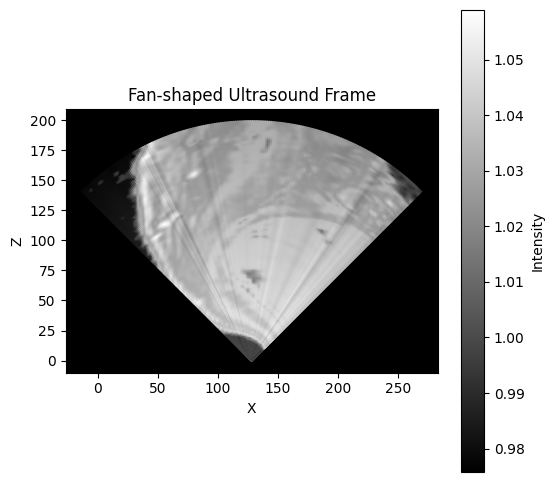

In [10]:
output = UR.plot_beam_frame(
    volume=Z_vol,
    source=torch.tensor([100,40.,0]),
    directions=torch.tensor(directions),
    angle=45
)


## US

In [11]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML


In [12]:
VIDEO = US.data.numpy()

np.float32(253.0)

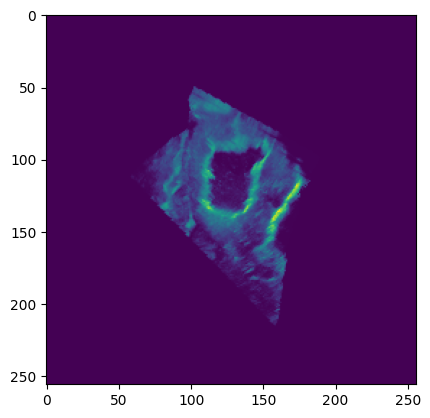

In [13]:
plt.imshow(VIDEO[100,:,:])
VIDEO.max()

In [20]:
vor = [0,1,0]

VIDEO[:,1,:]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
def render_video(source, axis):
    fig = plt.figure()
    if axis==0:
        im = plt.imshow(source[0,:,:], cmap='gray', animated=True, vmin=0, vmax=VIDEO.max())

        def init():
            im.set_data(source[0,:,:])
            return im
        
        def animate(i):
            im.set_data(source[i,:,:])
            return im
    
    if axis == 1:
        im = plt.imshow(source[:,0, :], cmap='gray', animated=True, vmin=0, vmax=VIDEO.max())

        def init():
            im.set_data(source[:,0, :])
            return im

        def animate(i):
            im.set_data(source[:,i, :])
            return im
    
    if axis == 2:
        im = plt.imshow(source[:, :, 0], cmap='gray', animated=True, vmin=0, vmax=VIDEO.max())

        def init():
            im.set_data(source[:, :, 0])
            return im

        def animate(i):
            im.set_data(source[:, :, i])
            return im
    
    return animation.FuncAnimation(fig, animate, init_func=init, frames=VIDEO.shape[0], interval=50)

anim = render_video(source=VIDEO[:,0,:], axis=0)

plt.close(fig)  # Close the figure after creating the animation

HTML(anim.to_jshtml())  # Display the animation in Jupyter Notebook